# UnetAtt Research 2 - assessing results
## Attention layout, kernel size, num stages

## Dataset

We exploit the Dataset 1 from a list of dataset on ground-roll attenuation. Description of the Dataset 1 is available [here](https://github.com/analysiscenter/SeismicPro/blob/master/datasets/noise_attenuation.ipynb). 10 first seismograms of the train part we keep for model training, the rest ones for testing. 

Required imports:

In [1]:
import os
import sys
import datetime
import pprint


import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf


sys.path.append('../../..')

from seismicpro.batchflow import Pipeline, V, B, L, I, W, C
from seismicpro.batchflow.models.tf.layers import conv_block
from seismicpro.batchflow.models.tf import UNet

from seismicpro.src import (SeismicDataset, FieldIndex, TraceIndex, statistics_plot,
                            seismic_plot, spectrum_plot, merge_segy_files)
from seismicpro.models import UnetAtt, attention_loss, FieldMetrics


from seismicpro.batchflow.batchflow.research import Research, Option, KV
from seismicpro.batchflow.batchflow.utils import plot_results_by_config


%env CUDA_VISIBLE_DEVICES=5

env: CUDA_VISIBLE_DEVICES=5


Index dataset

In [2]:
path_raw = '/notebooks/data/noise_dataset_1/DN02A_LIFT_AMPSCAL.sgy'
path_lift = '/notebooks/data/noise_dataset_1/DN02B_SHOTS_LIFT1.sgy'

index = (FieldIndex(name='raw', extra_headers=['offset'], path=path_raw)
         .merge(FieldIndex(name='lift', path=path_lift)))
index.head()

,TraceNumber,offset,TRACE_SEQUENCE_FILE,file_id,TRACE_SEQUENCE_FILE,file_id
,,,raw,raw,lift,lift
FieldRecord,,,,,,
111906,1656,35,1,/notebooks/data/noise_dataset_1/DN02A_LIFT_AMP...,1,/notebooks/data/noise_dataset_1/DN02B_SHOTS_LI...
111906,1657,36,2,/notebooks/data/noise_dataset_1/DN02A_LIFT_AMP...,2,/notebooks/data/noise_dataset_1/DN02B_SHOTS_LI...
111906,1655,78,3,/notebooks/data/noise_dataset_1/DN02A_LIFT_AMP...,3,/notebooks/data/noise_dataset_1/DN02B_SHOTS_LI...
111906,1658,79,4,/notebooks/data/noise_dataset_1/DN02A_LIFT_AMP...,4,/notebooks/data/noise_dataset_1/DN02B_SHOTS_LI...
111906,1654,127,5,/notebooks/data/noise_dataset_1/DN02A_LIFT_AMP...,5,/notebooks/data/noise_dataset_1/DN02B_SHOTS_LI...


In [3]:
snapshots = {
  'att_kernel_3-att_layout_ca ca-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00',
  'att_kernel_3-att_layout_ca ca-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00',
  'att_kernel_3-att_layout_ca ca-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00',
  'att_kernel_3-att_layout_cna cna-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00',
  'att_kernel_3-att_layout_cna cna-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00',
  'att_kernel_3-att_layout_cna cna-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00',
  'att_kernel_5-att_layout_ca ca-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00',
  'att_kernel_5-att_layout_ca ca-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00',
  'att_kernel_5-att_layout_ca ca-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00',
  'att_kernel_5-att_layout_cna cna-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00',
  'att_kernel_5-att_layout_cna cna-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00',
  'att_kernel_5-att_layout_cna cna-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00',
  'att_kernel_7-att_layout_ca ca-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00',
  'att_kernel_7-att_layout_ca ca-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00',
  'att_kernel_7-att_layout_ca ca-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00',
  'att_kernel_7-att_layout_cna cna-att_num_stages_3': './my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00',
  'att_kernel_7-att_layout_cna cna-att_num_stages_4': './my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00',
  'att_kernel_7-att_layout_cna cna-att_num_stages_5': './my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00'
}

In [4]:
BATCH_SIZE=64

def exp_stack(x):
    return np.expand_dims(np.vstack(x), -1)

def make_data(batch, **kwagrs):
    return {'trace_raw': exp_stack(batch.raw), 'lift': exp_stack(batch.lift)}

def check_res(i, index, model_path):  
    test_set = SeismicDataset(TraceIndex(index.create_subset(index.indices[i: i+1])))
    
    fetches=['out_lift', 'attention_sigmoid', 'out_att'] 

    test_pipeline = (Pipeline()
                 .load_model("dynamic", UnetAtt, 'unet', path=model_path)
                 .init_variable('res', default=list())
                 .init_variable('raw', default=list())
                 .init_variable('lift', default=list())
                 .load(components=('raw', 'lift'), fmt='segy', tslice=np.arange(3000))
                 .update_variable('raw', B('raw'), mode='a')
                 .update_variable('lift', B('lift'), mode='a')
                 .predict_model('unet', make_data=make_data, fetches=fetches, save_to=V('res', 'a')))
    
    test_pipeline = test_pipeline << test_set
    test_pipeline = test_pipeline.run(batch_size=1000, n_epochs=1, drop_last=False,
                                  shuffle=False, bar=True)
    
    raw = np.vstack([np.vstack(x) for x in test_pipeline.get_variable('raw')])
    lift = np.vstack([np.vstack(x) for x in test_pipeline.get_variable('lift')])
    out = np.squeeze(np.vstack([x[0] for x in test_pipeline.get_variable('res')]))
    att = np.squeeze(np.vstack([x[1] for x in test_pipeline.get_variable('res')]))
    att_raw = np.squeeze(np.vstack([x[2] for x in test_pipeline.get_variable('res')]))
   
    return raw, att, att_raw, lift, out


def draw(field_idx, snapshots, arrs_maker, names, cvs, ax):
    plt.suptitle('Field ' + str(field_idx))
    for x, config in enumerate(sorted(snapshots)):
        model_path = snapshots[config]
        raw, att, att_raw, lift, out = check_res(field_idx, index, model_path)

        ax[x, 0].set_ylabel(config)

        for y, arr in enumerate(arrs_maker(raw, att, att_raw, lift, out)):

            arr = np.squeeze(arr)
            xlim = (0, len(arr))
            ylim = (0, len(arr[0]))


            if isinstance(cvs[y], tuple):
                cvmin, cvmax = cvs[y]
            else:
                cvmax = cvs[y]
                cvmin = -cvmax

            ax[x, y].imshow(arr.T, cmap='gray', vmin=cvmin, vmax=cvmax)
            ax[x, y].set_title(names[y])
            ax[x, y].set_ylim([ylim[1], ylim[0]])
            ax[x,y].set_xlim(xlim)
            ax[x, y].set_aspect('auto')

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:24,  8.12s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 50%|█████     | 2/4 [00:16<00:16,  8.29s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 75%|███████▌  | 3/4 [00:24<00:08,  8.17s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:31, 10.46s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 50%|█████     | 2/4 [00:19<00:20, 10.13s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 75%|███████▌  | 3/4 [00:28<00:09,  9.83s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:30, 10.02s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 50%|█████     | 2/4 [00:20<00:20, 10.26s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 75%|███████▌  | 3/4 [00:31<00:10, 10.35s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:24,  8.12s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 50%|█████     | 2/4 [00:16<00:16,  8.06s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 75%|███████▌  | 3/4 [00:24<00:08,  8.09s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 25%|██▌       | 1/4 [00:09<00:27,  9.02s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 50%|█████     | 2/4 [00:18<00:18,  9.11s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 75%|███████▌  | 3/4 [00:27<00:09,  9.24s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:31, 10.63s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 50%|█████     | 2/4 [00:21<00:21, 10.55s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 75%|███████▌  | 3/4 [00:31<00:10, 10.52s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:25,  8.62s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 50%|█████     | 2/4 [00:16<00:16,  8.44s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 75%|███████▌  | 3/4 [00:25<00:08,  8.42s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:26,  8.82s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 50%|█████     | 2/4 [00:18<00:17,  8.97s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 75%|███████▌  | 3/4 [00:27<00:09,  9.11s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:31, 10.49s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 50%|█████     | 2/4 [00:20<00:20, 10.47s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 75%|███████▌  | 3/4 [00:31<00:10, 10.49s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
100%|██████████| 4/4 [00:41<00:00, 10.46s/it]


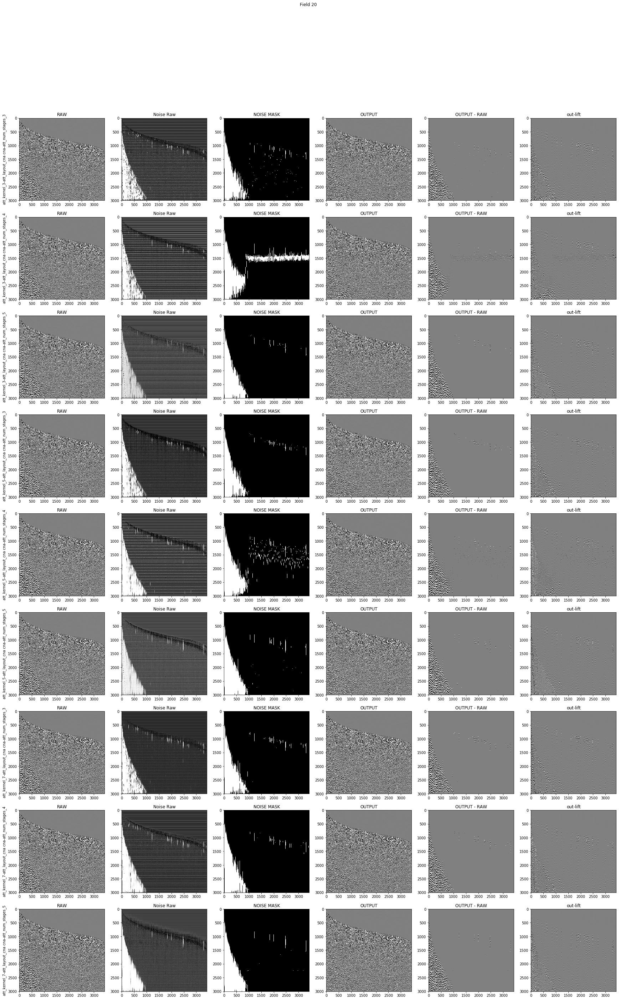

In [7]:
sn = {k: snapshots[k] for k in snapshots if 'cna cna' in k}

field_idx = 20

fig, ax = plt.subplots(len(sn), 6, figsize=(30, 45), squeeze=False)
names=['RAW', 'Noise Raw', 'NOISE MASK', 'OUTPUT', 'OUTPUT - RAW', 'out-lift']
cvs = [0.1, (0, 1), (0, 1), 0.1, 0.1, 0.1]
def arrs_maker(raw, att, att_raw, lift, out):
    return [raw, att_raw, att, out, out - raw, out -lift]

draw(field_idx, sn, arrs_maker, names, cvs, ax)

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 25%|██▌       | 1/4 [00:09<00:27,  9.31s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 50%|█████     | 2/4 [00:17<00:17,  8.88s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
 75%|███████▌  | 3/4 [00:25<00:08,  8.67s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:57:26.622679+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 25%|██▌       | 1/4 [00:09<00:27,  9.18s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 50%|█████     | 2/4 [00:18<00:18,  9.30s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
 75%|███████▌  | 3/4 [00:28<00:09,  9.43s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:06:41.212511+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:32, 10.76s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 50%|█████     | 2/4 [00:22<00:22, 11.06s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
 75%|███████▌  | 3/4 [00:33<00:10, 10.89s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:15:45.791465+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 25%|██▌       | 1/4 [00:07<00:23,  7.73s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 50%|█████     | 2/4 [00:16<00:15,  7.93s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
 75%|███████▌  | 3/4 [00:24<00:08,  8.02s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:25:36.494680+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 25%|██▌       | 1/4 [00:09<00:27,  9.11s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 50%|█████     | 2/4 [00:18<00:18,  9.09s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
 75%|███████▌  | 3/4 [00:27<00:09,  9.15s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:35:17.937747+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:32, 10.75s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 50%|█████     | 2/4 [00:20<00:21, 10.60s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
 75%|███████▌  | 3/4 [00:31<00:10, 10.57s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:44:43.318199+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:24,  8.16s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 50%|█████     | 2/4 [00:16<00:16,  8.15s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
 75%|███████▌  | 3/4 [00:24<00:08,  8.22s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_00:54:53.508629+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 25%|██▌       | 1/4 [00:08<00:26,  8.72s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 50%|█████     | 2/4 [00:18<00:17,  8.92s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
 75%|███████▌  | 3/4 [00:27<00:08,  9.00s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:04:34.346322+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 25%|██▌       | 1/4 [00:10<00:31, 10.44s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 50%|█████     | 2/4 [00:20<00:20, 10.47s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
 75%|███████▌  | 3/4 [00:32<00:10, 10.65s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-25_01:14:04.133284+03:00/model-3200
100%|██████████| 4/4 [00:42<00:00, 10.49s/it]


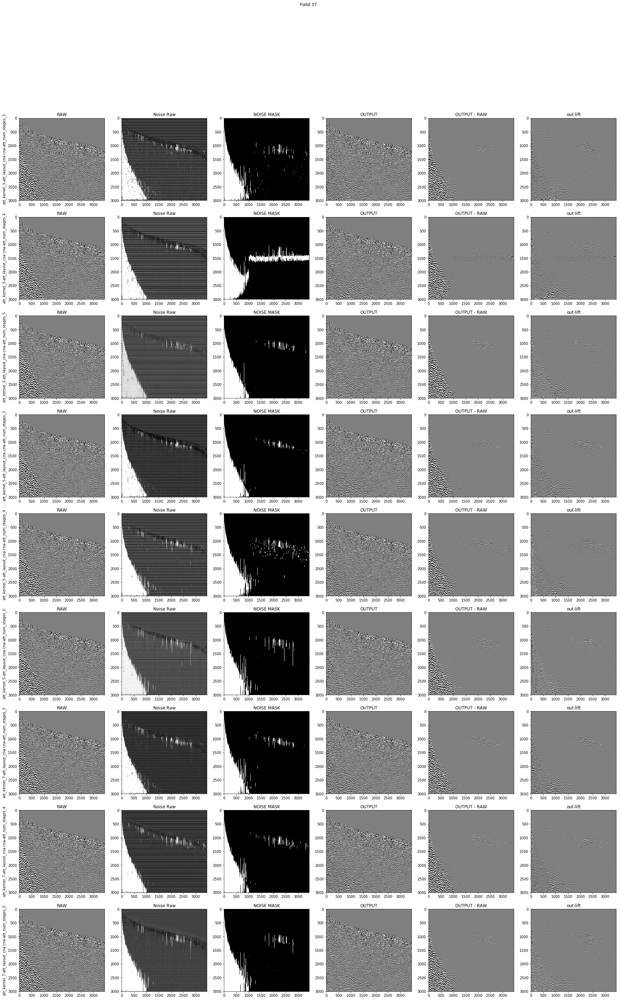

In [8]:
# sn = {k: snapshots[k] for k in snapshots if 'cna cna' in k}
field_idx = 37

fig, ax = plt.subplots(len(sn), 6, figsize=(30, 45), squeeze=False)
draw(field_idx, sn, arrs_maker, names, cvs, ax)

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200
 25%|██▌       | 1/4 [00:06<00:20,  6.68s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200
 50%|█████     | 2/4 [00:12<00:12,  6.41s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200
 75%|███████▌  | 3/4 [00:18<00:06,  6.17s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:38:43.860656+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200
 25%|██▌       | 1/4 [00:05<00:17,  5.90s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200
 50%|█████     | 2/4 [00:11<00:11,  5.91s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200
 75%|███████▌  | 3/4 [00:17<00:05,  5.96s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:47:06.336060+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200
 25%|██▌       | 1/4 [00:06<00:18,  6.25s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200
 50%|█████     | 2/4 [00:12<00:12,  6.23s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200
 75%|███████▌  | 3/4 [00:19<00:06,  6.34s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_22:55:18.734160+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200
 25%|██▌       | 1/4 [00:05<00:16,  5.40s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200
 50%|█████     | 2/4 [00:10<00:10,  5.44s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200
 75%|███████▌  | 3/4 [00:16<00:05,  5.55s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:04:10.689624+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200
 25%|██▌       | 1/4 [00:06<00:18,  6.13s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200
 50%|█████     | 2/4 [00:12<00:12,  6.10s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200
 75%|███████▌  | 3/4 [00:18<00:06,  6.20s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:12:46.412046+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200
 25%|██▌       | 1/4 [00:06<00:18,  6.21s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200
 50%|█████     | 2/4 [00:12<00:12,  6.16s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200
 75%|███████▌  | 3/4 [00:18<00:06,  6.30s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:21:10.997547+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200
 25%|██▌       | 1/4 [00:05<00:17,  5.71s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200
 50%|█████     | 2/4 [00:11<00:11,  5.79s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200
 75%|███████▌  | 3/4 [00:17<00:05,  5.74s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:30:28.359004+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200
 25%|██▌       | 1/4 [00:05<00:17,  5.94s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200
 50%|█████     | 2/4 [00:12<00:12,  6.03s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200
 75%|███████▌  | 3/4 [00:18<00:06,  6.03s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:39:17.251425+03:00/model-3200
  0%|          | 0/4 [00:00<?, ?it/s]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200
 25%|██▌       | 1/4 [00:06<00:20,  6.70s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200
 50%|█████     | 2/4 [00:13<00:13,  6.61s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200
 75%|███████▌  | 3/4 [00:19<00:06,  6.50s/it]

INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200


INFO:tensorflow:Restoring parameters from ./my_mdl/noise_dataset_1/2019-10-24_23:47:53.826267+03:00/model-3200
100%|██████████| 4/4 [00:25<00:00,  6.26s/it]


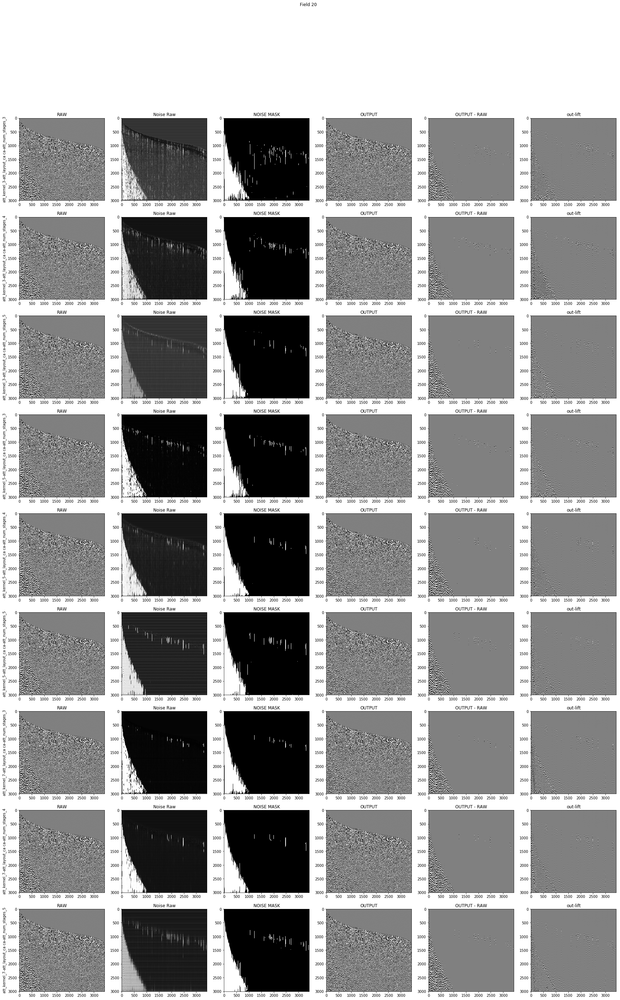

In [9]:
sn = {k: snapshots[k] for k in snapshots if 'ca ca' in k}

field_idx = 20

fig, ax = plt.subplots(len(sn), 6, figsize=(30, 45), squeeze=False)
draw(field_idx, sn, arrs_maker, names, cvs, ax)